In [1]:
print('Start import')
import socket
import strax
import straxen
import numpy as np
import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import datetime
import pandas as pd
print(
f'''Working on {socket.getfqdn()} with the following versions 
and installation paths:
strax
\tv{strax.__version__}\t{str(strax.__path__[0])}
straxen
\tv{straxen.__version__}\t{str(straxen.__path__[0])}
''')
from multihist import Hist1d, Histdd
import time
import itertools
import os

from scipy import stats
from straxen import units
from scipy.optimize import curve_fit

import peaks_utility as psu
import drift_diffusion_utility as ddu
import s2widthcut_utility as wcu
import math
from datetime import datetime, timedelta
import cutax

Start import
Working on midway2-0416.rcc.local with the following versions 
and installation paths:
strax
	v1.1.0	/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/strax
straxen
	v1.1.1	/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/straxen



In [2]:
st = cutax.xenonnt_v5(cuts_for=['commissioning.krypton_selections', 'commissioning.commissioning_cuts'])

In [10]:
dsets = st.select_runs(include_tags='_sr0_preliminary', run_mode='tpc_radon',available='event_info')
#dsets = st.select_runs(include_tags='_sr0_preliminary', run_mode='ambe*',available='event_info')

Fetching run info from MongoDB:   0%|          | 0/23824 [00:00<?, ?it/s]

Checking data availability:   0%|          | 0/3 [00:00<?, ?it/s]

In [11]:
dsets = dsets[(dsets.end > pd.to_datetime('06/03/2021'))]

In [12]:
runs = np.array(dsets['name'])

In [13]:
runs

array(['023991', '023939', '023892', '023834', '023759', '023756',
       '023748', '023713', '023710', '023707', '023704', '023671',
       '023390', '023387', '023384', '023381', '023343', '023328',
       '023088', '023067', '023055', '023052', '022894', '022892',
       '022886', '022883', '022880', '022877', '022874', '022871',
       '022833', '022830', '022827', '022824', '022815', '022809',
       '022800', '022797', '022794', '022791', '022788', '022779',
       '022773', '022729', '022726', '022664', '022507', '022363',
       '022225'], dtype=object)

In [7]:
ev = wcu.merge_runs_cutax(st,runs)
ev.to_pickle('data/SR0_v5_Rn220_22225_23991_datasets.pkl')

Reading runs from 022225 to 023991
n. 4 run 023756 elapsed time: 26.88 s
n. 9 run 023704 elapsed time: 85.26 s
n. 14 run 023381 elapsed time: 142.61 s
n. 19 run 023055 elapsed time: 192.96 s
n. 24 run 022883 elapsed time: 242.25 s
n. 29 run 022833 elapsed time: 300.18 s
n. 34 run 022809 elapsed time: 367.20 s
n. 39 run 022788 elapsed time: 441.11 s
n. 44 run 022664 elapsed time: 515.88 s


In [3]:
evAB = pd.read_pickle('/dali/lgrandi/dandrea/data/SR0_v4_AmBe_21286_21463_datasets.pkl')
evRn = pd.read_pickle('/dali/lgrandi/dandrea/data/SR0_v4_Rn220_21918_24075_datasets.pkl')
evKr = pd.read_pickle('/dali/lgrandi/dandrea/data/SR0_v4_Kr83m_20210802_datasets.pkl')
#evRn = pd.read_pickle('/dali/lgrandi/dandrea/data/SR0_v5_Rn220_22225_23991_datasets.pkl')
evABall, evABnw, evABfw = wcu.cutevents_wires(evAB)
evRnall, evRnnw, evRnfw = wcu.cutevents_wires(evRn)
evKrall, evKrnw, evKrfw = wcu.cutevents_wires(evKr)

In [4]:
modKr = (44.04,0.673,3.2)

In [82]:
from scipy.stats import chi2
def s2_width_model(t, D, vd, tGate):
    sigma_to_r50p = stats.norm.ppf(0.75) - stats.norm.ppf(0.25)
    return sigma_to_r50p * np.sqrt(2 * D * (t-tGate) / vd**2)

def s2_width_norm(width,s2_width_model):
    scw = 258.41  # s2_secondary_sc_width median
    SigmaToR50 = 1.349
    normWidth = (np.square(width) - np.square(scw)) / np.square(s2_width_model)
    return normWidth

def line(x,a,b):
    return a * x + b
from scipy.interpolate import interp1d
def S2WidthNormalized(events, title, mod_par = (45, 0.675, 3), wrange = (0,10), perc = (1,99), delta=0.25,
                      cut_chi2 = -14, plot=False ):
    
    s2width = events['s2_range_50p_area']
    drift = events['drift_time']/1e3
    s2area = events['s2_area']
    
    D_mod = mod_par[0]*1e3 * units.cm**2 / units.s
    vd_mod = mod_par[1] * units.mm / units.us
    tG_mod = mod_par[2] * units.ns
    normWidth = s2_width_norm(events['s2_range_50p_area'],s2_width_model(events['drift_time']/1e3, D_mod, vd_mod, tG_mod))
    aspace, aspace0 = np.logspace(2, 6.5, 300), np.logspace(2, 6.5, 50)
    aa, aa0 = (aspace[1:]+aspace[:-1])/2, (aspace0[1:]+aspace0[:-1])/2
    #low_cut1 = line(np.log10(aspace),0,0.25)
    #s2width_lcut1 = interp1d(aspace, low_cut1, bounds_error=False, fill_value='extrapolate',kind='cubic')
    #cut1 = np.ones(len(events), dtype=bool)
    #cut1 &= normWidth > s2width_lcut1(events['s2_area'])
    #events =  events[cut1]
    
    nspace = np.linspace(wrange[0], wrange[1], 300)
    normWidth = s2_width_norm(events['s2_range_50p_area'],s2_width_model(events['drift_time']/1e3, D_mod, vd_mod, tG_mod))
    pha = Histdd(events['s2_area'], normWidth, bins=(aspace, nspace))
    s2area = events['s2_area']
    print(f'Total events {len(events)}')
    
    # cut with lines
    aspace1, aspace2 = np.logspace(2, 3.5, 100), np.logspace(3.5,6.5, 200)
    low_cut =  np.concatenate((line(np.log10(aspace1),(1-delta)/1.5,(2*delta-2)/1.5),
                               1.0 - delta + 0*np.log10(aspace2)))
    high_cut = np.concatenate((line(np.log10(aspace1),(delta-3)/1.5,(12-2*delta)/1.5),
                               1.0 + delta + 0*np.log10(aspace2)))
    s2width_lcut = interp1d(aspace, low_cut, bounds_error=False, fill_value='extrapolate',kind='cubic')
    s2width_hcut = interp1d(aspace, high_cut, bounds_error=False, fill_value='extrapolate',kind='cubic')
    cut = np.ones(len(events), dtype=bool)
    cut &= normWidth < s2width_hcut(events['s2_area'])
    cut &= normWidth > s2width_lcut(events['s2_area'])
    perc0 = len(events[cut])/len(events)*100
    print(f'Cut with lines: survived events {len(events[cut])} -> {perc0:.2f}%')
    
    #cut with percentile
    #pha0 = Histdd(events['s2_area'], normWidth, bins=(aspace0, nspace))
    #perc90a = np.array(pha0.percentile(percentile=perc[1], axis=1))
    #perc10a = np.array(pha0.percentile(percentile=perc[0], axis=1))
    #s2width_lperc = interp1d(aa0, perc10a, bounds_error=False, fill_value='extrapolate',kind='cubic')
    #s2width_hperc = interp1d(aa0, perc90a, bounds_error=False, fill_value='extrapolate',kind='cubic')
    #cutp = np.ones(len(events), dtype=bool)
    #cutp &= normWidth < s2width_hperc(events['s2_area'])
    #cutp &= normWidth > s2width_lperc(events['s2_area'])
    #perc1 = len(events[cutp])/len(events)*100
    #print(f'Cut with percentile: survived events {len(events[cutp])} -> {perc1:.2f}%')
    
    # chi2 cut
    scg = 23.0 # pax_config.get('s2_secondary_sc_gain')
    cutc = chi2.logpdf(normWidth * (s2area/scg -1), s2area/scg) > cut_chi2
    chi2_ll = np.sqrt(chi2.ppf(0.01,s2area/scg)/(s2area/scg-1))
    chi2_hh = np.sqrt(chi2.ppf(0.99,s2area/scg)/(s2area/scg-1))
    #cutc = np.ones(len(events), dtype=bool)
    #cutc &= normWidth < chi2_hh
    #cutc &= normWidth > chi2_ll
    nWc = s2_width_norm(events[cutc]['s2_range_50p_area'],s2_width_model(events[cutc]['drift_time']/1e3, D_mod, vd_mod, tG_mod))
    ph = Histdd(events[cutc]['s2_area'], nWc, bins=(aspace0, nspace))
    p00 = np.array(ph.percentile(percentile=1e-5, axis=1))
    p99 = np.array(ph.percentile(percentile=100-1e-5, axis=1))
    c_ll = interp1d(aa0, p00, bounds_error=False, fill_value='extrapolate',kind='quadratic')
    c_hh = interp1d(aa0, p99, bounds_error=False, fill_value='extrapolate',kind='quadratic')
    perc2 = len(events[cutc])/len(events)*100
    print(f'Cut with chi2: survived events {len(events[cutc])} -> {perc2:.2f}%')
    
    # new cut
    na1, na2 = np.logspace(2, 4.1, 20), np.logspace(4.1,6.5, 25)
    naa = np.logspace(2, 6.5, 45)
    na01 = (na1[1:]+na1[:-1])/2
    ph = Histdd(events[cutc]['s2_area'], nWc, bins=(na1, nspace))
    p00 = np.array(ph.percentile(percentile=1e-5, axis=1))
    p99 = np.array(ph.percentile(percentile=100-1e-5, axis=1))
    nc_ll = interp1d(na01, p00, bounds_error=False, fill_value='extrapolate',kind='quadratic')
    nc_hh = interp1d(na01, p99, bounds_error=False, fill_value='extrapolate',kind='quadratic')
    A = ((16,4,1),(25,5,1),(36,6,1))
    bl, bh = (nc_ll(na1[-1]), 0.8, 1), (nc_hh(na1[-1]), 1.4, 1.6)
    xl, xh = np.linalg.solve(A,bl), np.linalg.solve(A,bh)
    nll_cut = np.concatenate((nc_ll(na1), xl[0]*np.log10(na2)**2 + xl[1]*np.log10(na2) + xl[2]))
    nhh_cut = np.concatenate((nc_hh(na1), xh[0]*np.log10(na2)**2 + xh[1]*np.log10(na2) + xh[2]))
    nlcut = interp1d(naa, nll_cut, bounds_error=False, fill_value='extrapolate',kind='cubic')
    nhcut = interp1d(naa, nhh_cut, bounds_error=False, fill_value='extrapolate',kind='cubic')
    
    #perc3 = len(events[cutc])/len(events)*100
    #print(f'Cut with chi2: survived events {len(events[cutc])} -> {perc3:.2f}%')
    
    
    if plot:
        plt.figure(figsize=(12,6))
        pha.plot(log_scale=True, cblabel='events')
        plt.axhline(y=1,c='black',ls='--')
        #plt.plot(aa0, perc10a, 'b--', ds='steps',label=f'{perc[0]}-{perc[1]}% percentile: {perc1:.2f}%')
        #plt.plot(aa0, perc90a, 'b--', ds='steps')
        plt.xlabel("S2 area (PE)", ha='right', x=1,fontsize=12)
        plt.ylabel("Normalized S2 width 50% (ns)", ha='right', y=1,fontsize=12)
        plt.title(f'{title}',fontsize=14)
        plt.xscale('log')
        #plt.plot(aspace, s2width_lcut(aspace),c='black',ls='--',label=f'lines cut: {perc0:.2f}%')
        #plt.plot(aspace, s2width_hcut(aspace),c='black',ls='--')
        #plt.plot(aa0, c_ll(aa0),'r--',label=f'chi2 cut: {perc2:.2f}%')
        #plt.plot(aa0, c_hh(aa0),'r--')
        plt.plot(aspace, nlcut(aspace),'b--',label=f'new cut')#: {perc2:.2f}%')
        plt.plot(aspace, nhcut(aspace),'b--')
        plt.legend(fontsize=14)
        plt.figure(figsize=(12,6))
        aspace0 = np.linspace(0, 5000, 50)
        aa0 = (aspace0[1:]+aspace0[:-1])/2
        c1, ee = np.histogram(events[cut]['s2_area'], bins=aspace0)
        #c2, ee = np.histogram(events[cutp]['s2_area'], bins=aspace0)
        c3, ee = np.histogram(events[cutc]['s2_area'], bins=aspace0)
        cc, ee = np.histogram(events['s2_area'], bins=aspace0)
        plt.figure(figsize=(12,6))
        plt.plot(aa0,c1/cc,c='black',ds='steps',label='lines cut')
        #plt.plot(aa0,c2/cc,c='b',ds='steps',label=f'{perc[0]}-{perc[1]}% percentile')
        plt.plot(aa0,c3/cc,c='r',ds='steps',label='chi2 cut')
        plt.xlabel("S2 area (PE)", ha='right', x=1,fontsize=12)
        plt.ylabel("acceptance", ha='right', y=1,fontsize=12)
        #plt.xscale('log')
        plt.legend(fontsize = 14)
    return nlcut, nhcut

/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:1302: RuntimeWarning: invalid value encountered in subtract
  return sc.xlogy(df/2.-1, x) - x/2. - sc.gammaln(df/2.) - (np.log(2)*df)/2.


Total events 224399
Cut with lines: survived events 121153 -> 53.99%
Cut with chi2: survived events 57265 -> 25.52%


/tmp/jobs/13952628/ipykernel_197/2521878342.py:129: RuntimeWarning: invalid value encountered in true_divide
  plt.plot(aa0,c1/cc,c='black',ds='steps',label='lines cut')
/tmp/jobs/13952628/ipykernel_197/2521878342.py:131: RuntimeWarning: invalid value encountered in true_divide
  plt.plot(aa0,c3/cc,c='r',ds='steps',label='chi2 cut')


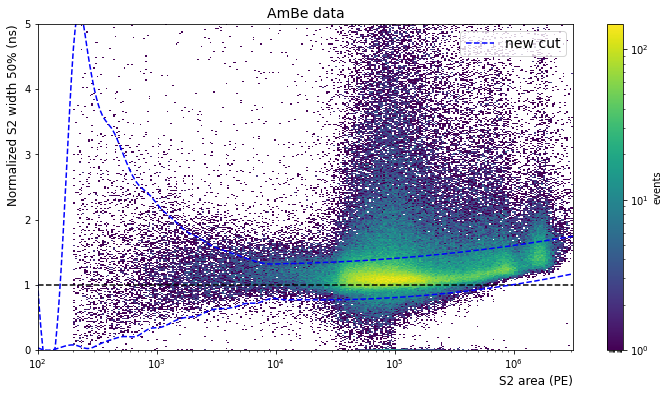

<Figure size 864x432 with 0 Axes>

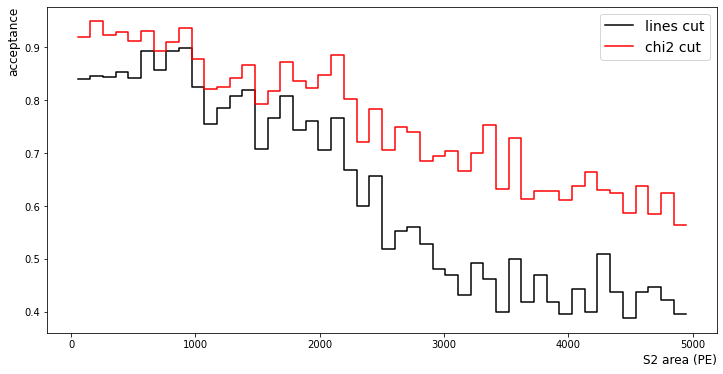

In [83]:
S2WidthCutAB = S2WidthNormalized(evABfw,'AmBe data', mod_par = modKr, wrange = (0,5), delta=0.3,
                                 perc = (0.5,95), cut_chi2 = -14, plot = 1 )

/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Total events 972825
Cut with lines: survived events 450505 -> 46.31%


/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:1302: RuntimeWarning: invalid value encountered in subtract
  return sc.xlogy(df/2.-1, x) - x/2. - sc.gammaln(df/2.) - (np.log(2)*df)/2.


Cut with chi2: survived events 297669 -> 30.60%


/tmp/jobs/13952628/ipykernel_197/2521878342.py:129: RuntimeWarning: invalid value encountered in true_divide
  plt.plot(aa0,c1/cc,c='black',ds='steps',label='lines cut')
/tmp/jobs/13952628/ipykernel_197/2521878342.py:131: RuntimeWarning: invalid value encountered in true_divide
  plt.plot(aa0,c3/cc,c='r',ds='steps',label='chi2 cut')


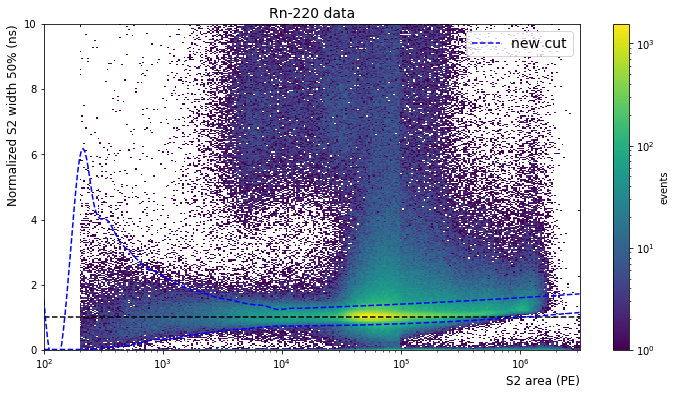

<Figure size 864x432 with 0 Axes>

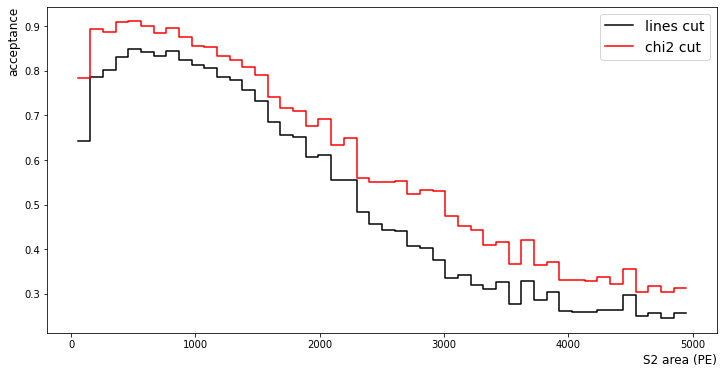

In [97]:
S2WidthCutRn = S2WidthNormalized(evRnfw,'Rn-220 data', mod_par = modKr, wrange = (0,10),
                                     delta=0.3,perc=(0.5,95),cut_chi2=-14,plot=1 )

In [55]:
peaks = st.get_array('022225',['peaks','peak_basics'],seconds_range=(0,10))

Loading plugins: |          | 0.00 % [00:00<?]

In [47]:
pk2 = peaks[(peaks['type']==2)&(peaks['area']>8000)]

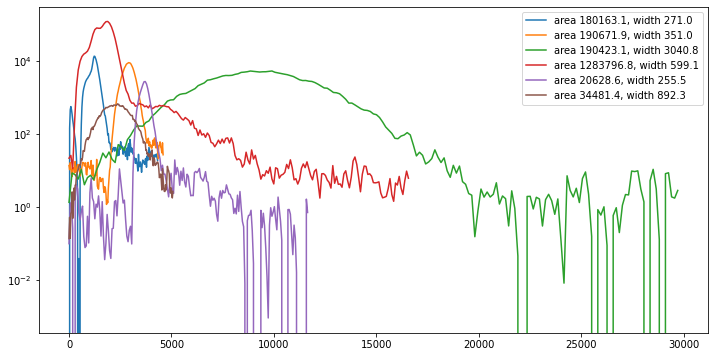

In [53]:
n = 6
plt.figure(figsize=(12,6))
for i in np.arange(n):
    dts = np.arange(0,pk2['length'][i]*pk2['dt'][i],pk2['dt'][i])
    data = pk2['data'][i][:len(dts)]
    area = pk2['area'][i]
    width = pk2['range_50p_area'][i]
    plt.plot(dts,data,label=f'area {area:.1f}, width {width:.1f}')
plt.legend()
plt.yscale('log')

In [98]:
import bokeh.plotting as bklt
from IPython.core.display import display, HTML
def display_events_S2WidthCut(st,run_id, nev = 1, area_cut=(1e2,1e7), s2_width_cut = None, mod_par = None,
                              selection = 0):
    if (st.is_stored(run_id, ('event_info'))==False): return print('No events stored')
    ev0 = st.get_array(run_id,['event_info', 'cut_s1_max_pmt',
                            'cut_s1_area_fraction_top',
                            'cut_s2_single_scatter',
                            'cut_s2_width_naive',
                            'cut_fiducial_volume',
                            'cut_daq_veto'],progress_bar=False)
    ev, evnr, evfw = wcu.cutevents_wires(ev0,FV=1)
    events = ev[(ev['s2_area'] > area_cut[0]) & (ev['s2_area'] < area_cut[1])]
    
    if s2_width_cut is not None:
        low_cut, high_cut  = s2_width_cut[0], s2_width_cut[1]
        D_mod = mod_par[0]*1e3 * units.cm**2 / units.s
        vd_mod = mod_par[1] * units.mm / units.us
        tG_mod = mod_par[2] * units.ns
        normWidth = s2_width_norm(events['s2_range_50p_area'],s2_width_model(events['drift_time']/1e3, D_mod, vd_mod, tG_mod))
        width_cut = normWidth < high_cut(events['s2_area'])
        width_cut &= normWidth > low_cut(events['s2_area'])
        ev_sel = events[width_cut]
        ev_low = events[normWidth < low_cut(events['s2_area'])]
        ev_high = events[normWidth > high_cut(events['s2_area'])]
        print('events before width cut',len(events))
        print('events after selection',len(ev_sel))
        print('events with low width',len(ev_low))
        print('events with high width',len(ev_high))
        if selection == 0: events = ev_sel
        elif selection == 1: events = ev_low
        elif selection == 2: events = ev_high
    for i in range(nev):
        idx = int(np.random.rand()*len(events))
        fig = st.event_display_interactive(run_id,
                                           time_range=(events[idx]['time'],
                                                       events[idx]['endtime']),
                                           bottom_pmt_array=False)
        bklt.show(fig)

In [100]:
display_events_S2WidthCut(st,'022225', nev = 1,area_cut=(5e4,1e5),s2_width_cut = S2WidthCutAB,
                          mod_par = modKr, selection = 1)

events before width cut 221
events after selection 175
events with low width 3
events with high width 43


/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:1302: RuntimeWarning: invalid value encountered in subtract
  return sc.xlogy(df/2.-1, x) - x/2. - sc.gammaln(df/2.) - (np.log(2)*df)/2.


Total events 709420
Cut with percentile: survived events 686965 -> 96.83%
Cut with lines: survived events 661619 -> 93.26%
Cut with chi2: survived events 495726 -> 69.88%


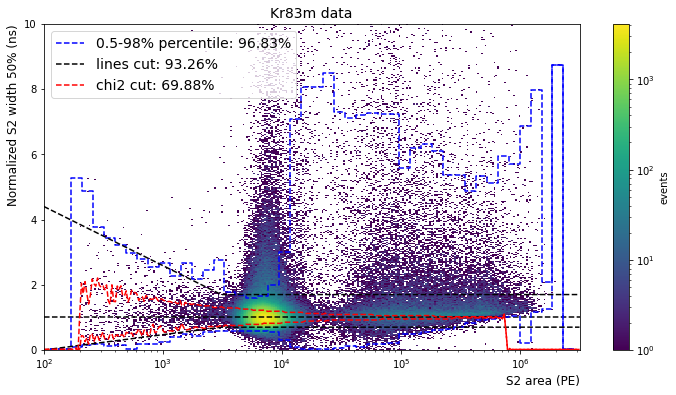

<Figure size 864x432 with 0 Axes>

In [72]:
S2WidthCutKr = S2WidthNormalized(evKrall,'Kr83m data', mod_par = modKr, wrange = (0,10),
                                     delta=0.3,perc=(0.5,98), plot=1 )
#S2WidthCutKr = wcu.S2WidthNormalized(evKrnw,'Kr83m data - near wires', mod_par = modKr, wrange = (0,10),
#                                     delta=0.3,perc=(2,98), plot=1 )
#S2WidthCutKr = wcu.S2WidthNormalized(evKrfw,'Kr83m data - far from wires', mod_par = modKr, wrange = (0,10),
#                                     delta=0.3,perc=(2,98), plot=1 )

/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


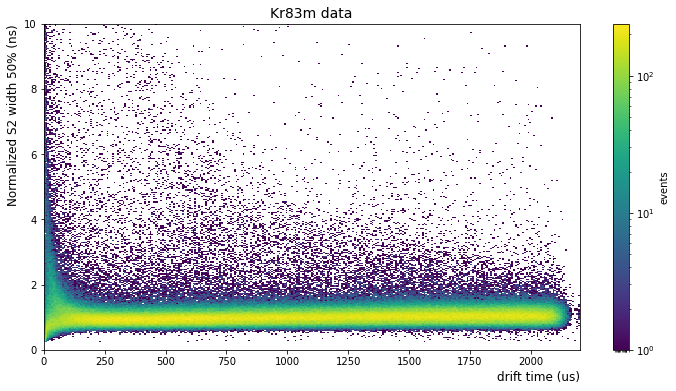

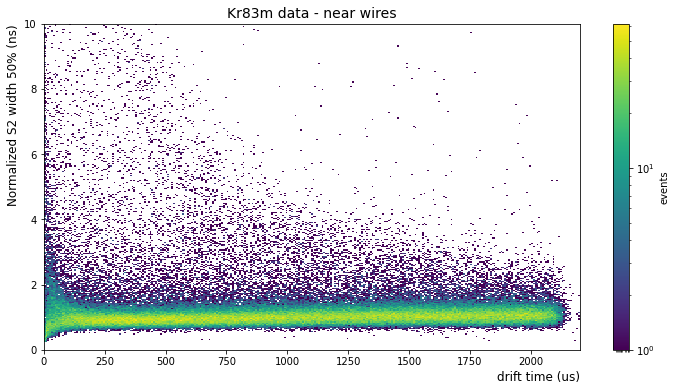

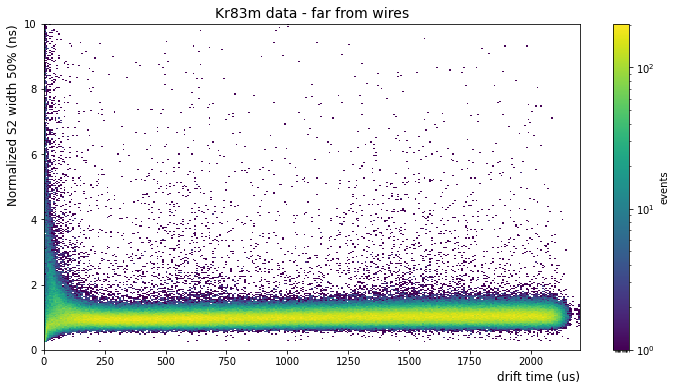

In [6]:
wcu.S2WidthNormalized_drift(evKrall,'Kr83m data', mod_par = modKr, wrange = (0,10), plot=1 )
wcu.S2WidthNormalized_drift(evKrnw,'Kr83m data - near wires', mod_par = modKr, wrange = (0,10), plot=1 )
wcu.S2WidthNormalized_drift(evKrfw,'Kr83m data - far from wires', mod_par = modKr, wrange = (0,10), plot=1 )

Total events 257012
Cut with percentile: survived events 242949 -> 94.53%
Cut with lines: survived events 135437 -> 52.70%


/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Total events 35455
Cut with percentile: survived events 33032 -> 93.17%
Cut with lines: survived events 15113 -> 42.63%
Total events 221557
Cut with percentile: survived events 209815 -> 94.70%
Cut with lines: survived events 120324 -> 54.31%


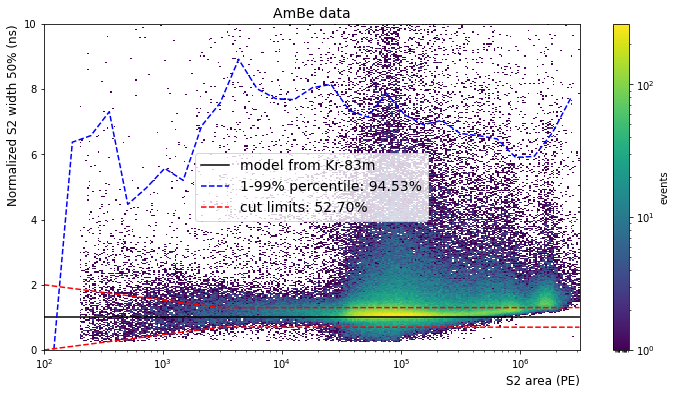

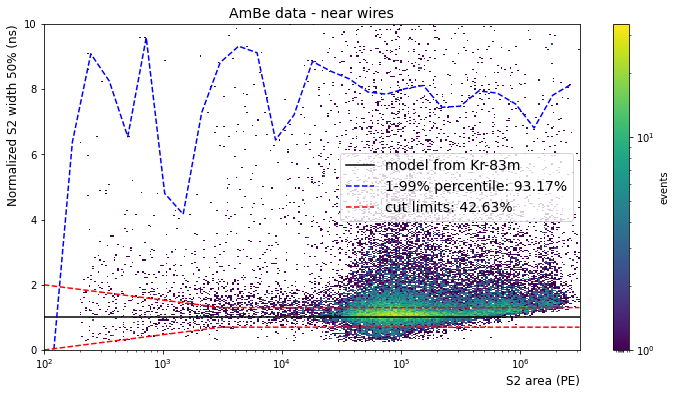

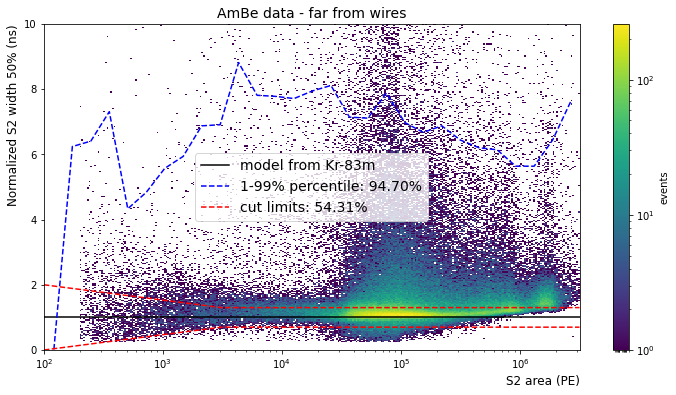

In [7]:
S2WidthCutAB = wcu.S2WidthNormalized(evABall,'AmBe data', mod_par = modKr, wrange = (0,10),
                                     delta=0.3,perc=(1,99),plot=1 )
S2WidthCutABNW = wcu.S2WidthNormalized(evABnw,'AmBe data - near wires', mod_par =modKr, wrange = (0,10),
                                   delta=0.3,perc=(1,99),plot=1 )
S2WidthCutABFW = wcu.S2WidthNormalized(evABfw,'AmBe data - far from wires', mod_par =modKr, wrange = (0,10),
                                   delta=0.3,perc=(1,99),plot=1 )

/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Total events 1149396
Cut with percentile: survived events 943476 -> 82.08%
Cut with lines: survived events 531326 -> 46.23%


/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Total events 211070
Cut with percentile: survived events 168696 -> 79.92%
Cut with lines: survived events 83365 -> 39.50%


/opt/XENONnT/anaconda/envs/XENONnT_development/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


Total events 938326
Cut with percentile: survived events 774501 -> 82.54%
Cut with lines: survived events 447961 -> 47.74%


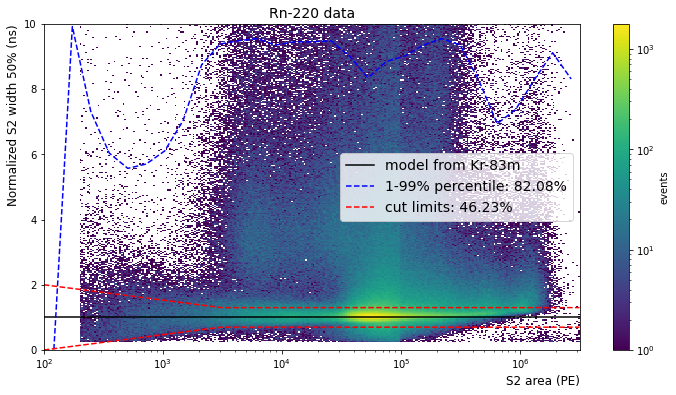

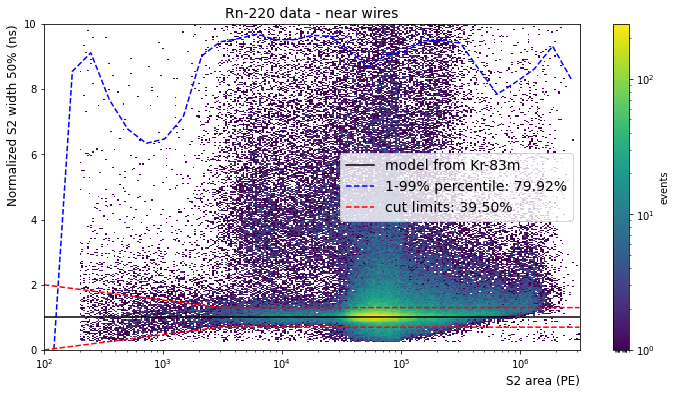

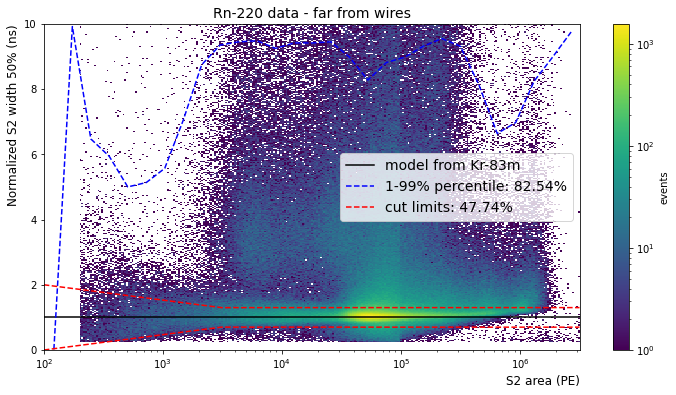

In [8]:
S2WidthCut = wcu.S2WidthNormalized(evRnall,'Rn-220 data', mod_par = modKr, wrange = (0,10),
                                   delta=0.3,perc=(1,99),plot=1 )
S2WidthCut = wcu.S2WidthNormalized(evRnnw,'Rn-220 data - near wires', mod_par = modKr, wrange = (0,10),
                                   delta=0.3,perc=(1,99),plot=1 )
S2WidthCut = wcu.S2WidthNormalized(evRnfw,'Rn-220 data - far from wires', mod_par = modKr, wrange = (0,10),
                                   delta=0.3,perc=(1,99),plot=1 )

In [ ]:
def analysis(events,title='Rn-220 data',modKr=(44.47,0.676,2.9)):
    ddu.plot_area_width_aft(events,title, low = 0, high = 7, low2 = 0, high2 = 1, binning = 500)
    wcu.plot_r2_z(events,title)
    wcu.S2WidthBasic(events, title, mod_par=modKr, wrange = (0,40000), fit_range = (250,1500), plot=1 )
    #S2WidthCut = wcu.S2WidthNormalized(events,title, mod_par = modKr, wrange = (0,10), plot=1)
    S2WidthCut0 = wcu.S2WidthNormLine(events,title, mod_par = modKr, wrange = (0,10), ll = 0, hh = 2, plot=0)
    S2WidthCut1 = wcu.S2WidthNormLine(events,title, mod_par = modKr, wrange = (0,10), ll = 2, hh = 5, plot=1)
    S2WidthCut2 = wcu.S2WidthNormLine(events,title, mod_par = modKr, wrange = (0,10), ll = 5, hh = 30, plot=0)
    #wcu.plot_position_distribution_cnn(events[S2WidthCut0], events[S2WidthCut1],
    #                               title1=title+' - S2WidthNorm < 2', title2=title+' - 2 < S2WidthNorm < 5', rebin=1)
    wcu.plot_r2_z(events[S2WidthCut0],title+'  S2WidthNorm < 2')
    wcu.S2WidthBasic(events[S2WidthCut0], title+' - S2WidthNorm < 2', mod_par=modKr, wrange=(0,40000), fit_range = (250,1500), plot=1 )
    wcu.plot_r2_z(events[S2WidthCut1],title+' - 2 < S2WidthNorm < 5')
    wcu.S2WidthBasic(events[S2WidthCut1], title+' - 2 < S2WidthNorm < 5', mod_par=modKr, wrange=(0,40000), fit_range = (250,1500), plot=1 )
    wcu.plot_r2_z(events[S2WidthCut2],title+' - S2WidthNorm > 5')
    wcu.S2WidthBasic(events[S2WidthCut2], title+' - S2WidthNorm > 5', mod_par=modKr, wrange=(0,40000), fit_range = (250,1500), plot=1 )
    return S2WidthCut

total events 222662
selected events 222662


/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:452: RuntimeWarning: invalid value encountered in sqrt
  return sigma_to_r50p * np.sqrt(2 * D * (t-tGate) / vd**2)


selected events 200311
selected events 16526


/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:452: RuntimeWarning: invalid value encountered in sqrt
  return sigma_to_r50p * np.sqrt(2 * D * (t-tGate) / vd**2)
/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:452: RuntimeWarning: invalid value encountered in sqrt
  return sigma_to_r50p * np.sqrt(2 * D * (t-tGate) / vd**2)


selected events 5443


/home/valerioda/xenon-notes/fast_response_analysis/s2widthcut_utility.py:452: RuntimeWarning: invalid value encountered in sqrt
  return sigma_to_r50p * np.sqrt(2 * D * (t-tGate) / vd**2)


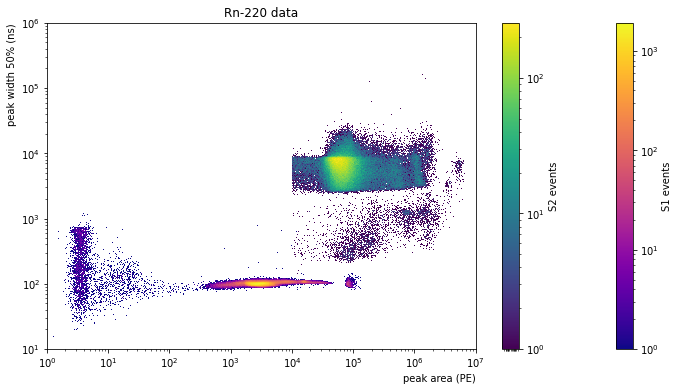

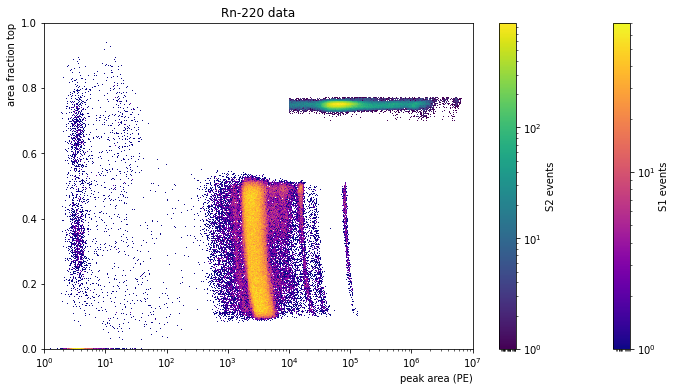

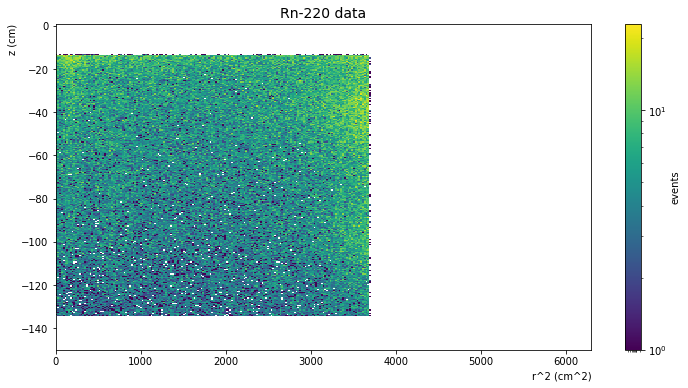

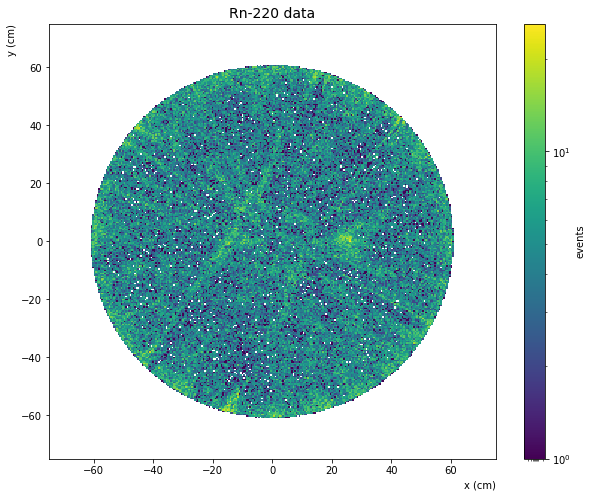

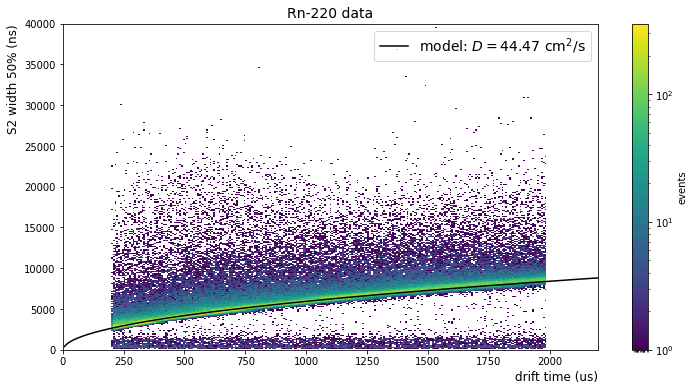

...

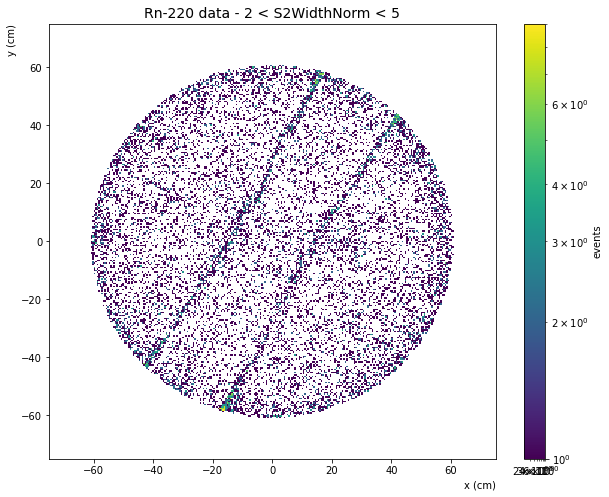

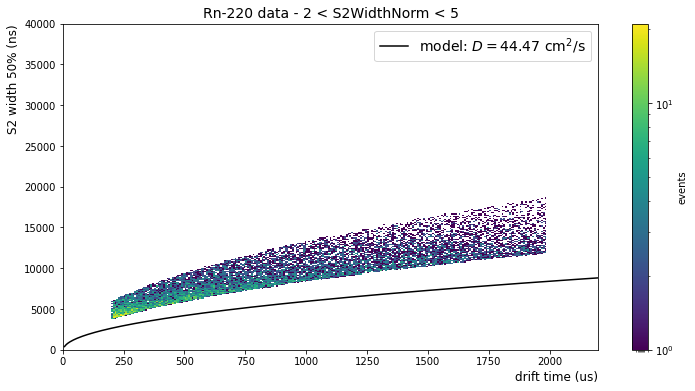

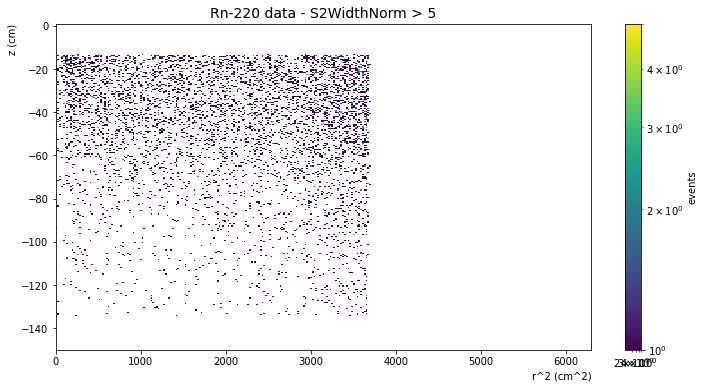

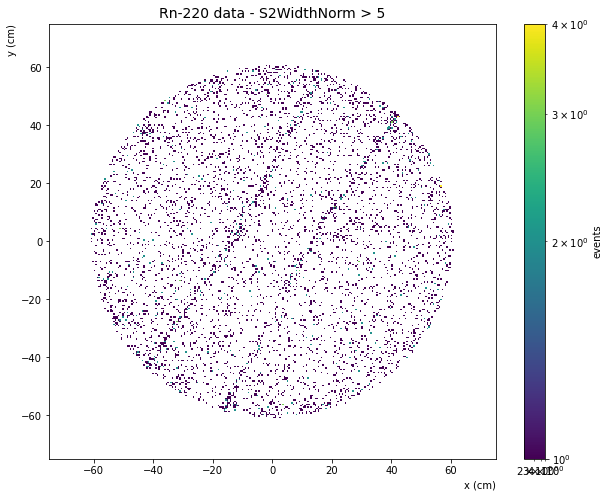

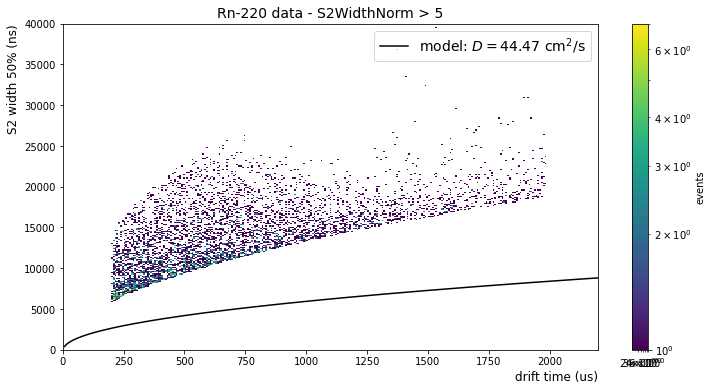

In [6]:
analysis(ev[mask],title='Rn-220 data')

In [ ]:
analysis(ev[mask&maskNW],title='Rn-220 data - near wires')

In [ ]:
analysis(ev[mask&maskFW],title='Rn-220 data - far from wires')

In [18]:
wcu.display_events_S2WidthCut(st,Rn220_runs[4], nev = 10, s2_width_cut = True)

run 023098, start 2021-06-16 00:56:09.224984, livetime 1800.44 s, rate: 13.08 Hz, selection rate: 0.40 Hz
total events 23553 selected events 1905
events before width cut 119 events after selection 112 no width cut 7


/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:329: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  bin_edges = np.array(bin_edges)
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([self.bin_centers(axis=i) for i in range(self.dimensions)])
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings

Loading BokehJS ...

/dali/lgrandi/strax/straxen/straxen/analyses/bokeh_waveform_plot.py:561: RuntimeWarning: divide by zero encountered in log10
  area_plot = np.log10(area_per_channel)


/dali/lgrandi/strax/straxen/straxen/analyses/bokeh_waveform_plot.py:561: RuntimeWarning: divide by zero encountered in log10
  area_plot = np.log10(area_per_channel)


In [19]:
wcu.display_events_S2WidthCut(st,Rn220_runs[4], nev = 10, s2_width_cut = False)

run 023098, start 2021-06-16 00:56:09.224984, livetime 1800.44 s, rate: 13.08 Hz, selection rate: 0.40 Hz
total events 23553 selected events 1905
events before width cut 119 events after selection 112 no width cut 7


/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:329: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  bin_edges = np.array(bin_edges)
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([self.bin_centers(axis=i) for i in range(self.dimensions)])
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings

/dali/lgrandi/strax/straxen/straxen/analyses/bokeh_waveform_plot.py:561: RuntimeWarning: invalid value encountered in log10
  area_plot = np.log10(area_per_channel)
